# 🦟 Malaria Mosquito Database (1898 - 2016): 
Distribution and Trends of Anopheline Vectors in Africa, This project aims to analyz over a century’s worth of data on mosquito species (especially Anopheles, known to transmit malaria) across Africa, with goals to:

1. Understand species distribution
2. Reveal temporal trends
3. Visualize geospatial spread
4. Predict mosquito presence using machine learning
5. Try to analyze high impact areas for funds intervention


## 1. Importing Libraries & Loading Data`

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster

# Load dataset
df = pd.read_csv("Africa_Vectors_database_1898-2016.csv", encoding="ISO-8859-1")

## 2. Initial Data Exploration
1. Display column names, data types, and number of missing values.
2. Summarize each column (like averages, most common values).
3. Identify the columns with the most missing data.

In [4]:
df.info()
df.describe(include="all")
df.isnull().sum().sort_values(ascending=False).head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13464 entries, 0 to 13463
Data columns (total 41 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Country                                 13464 non-null  object 
 1   GAUL_Admin1                             13364 non-null  object 
 2   GAUL_Admin2                             13075 non-null  object 
 3   Full_Name                               13464 non-null  object 
 4   Lat                                     13330 non-null  float64
 5   Long                                    13330 non-null  float64
 6   LatLong_Source                          13331 non-null  object 
 7   YeStart                                 13464 non-null  int64  
 8   YeEnd                                   13464 non-null  int64  
 9   An gambiae_complex                      11596 non-null  object 
 10  An gambiae ss                           3990 non-null   ob

An bwambae                 13438
An vaneedeni               13430
An parensis                13423
An leesoni                 13276
An rivulorum               13219
An. merus                  13210
Other sib species names    13205
An wellcomei               13192
An hancocki                13166
An paludis                 13088
dtype: int64

# 3. Top Mosquito Species Visualization
Goal: Identify the most recorded species across all samples.
Plot: Horizontal bar chart showing which Anopheles species appeared most often.

C:\Users\HP\AppData\Local\Temp\ipykernel_5528\2580465882.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=species_presence.values, y=species_presence.index, palette="viridis")


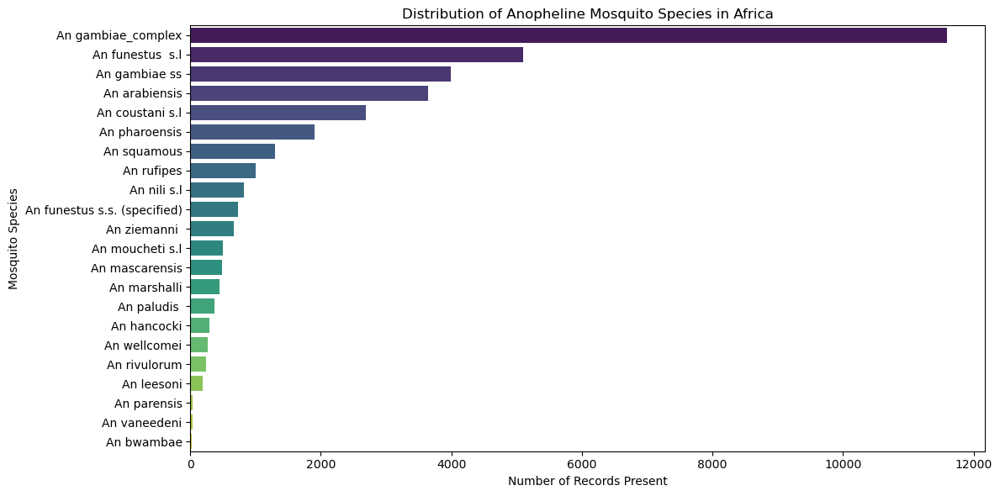

In [5]:
# Columns starting with "An " are species
species_columns = [col for col in df.columns if col.startswith("An ")]

# Count of species presence
species_presence = df[species_columns].notna().sum().sort_values(ascending=False)

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(x=species_presence.values, y=species_presence.index, palette="viridis")
plt.title("Distribution of Anopheline Mosquito Species in Africa")
plt.xlabel("Number of Records Present")
plt.ylabel("Mosquito Species")
plt.tight_layout()
plt.show()

## 4. Yearly Sampling Trends (1898–2016)
This is to Show how mosquito data collection evolved over time. A line graph of how many mosquito samples were collected per year.

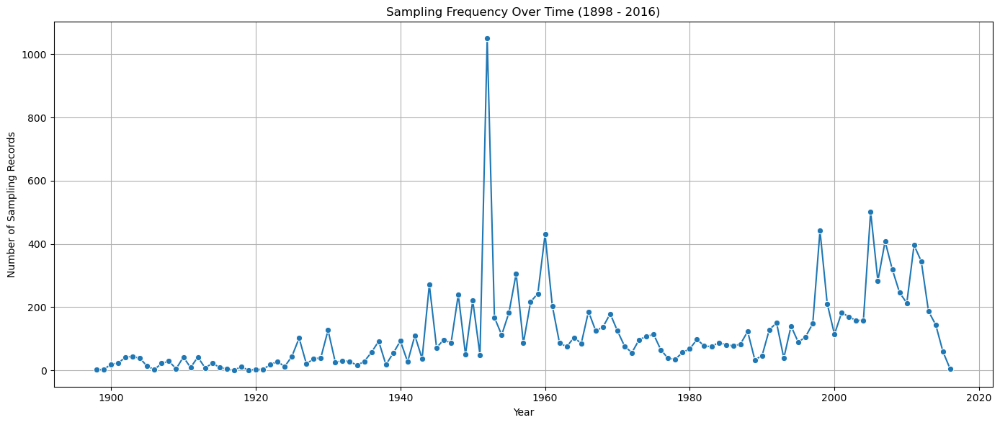

In [6]:
# Yearly data availability
yearly_counts = df["YeStart"].value_counts().sort_index()

plt.figure(figsize=(14, 6))
sns.lineplot(x=yearly_counts.index, y=yearly_counts.values, marker="o")
plt.title("Sampling Frequency Over Time (1898 - 2016)")
plt.xlabel("Year")
plt.ylabel("Number of Sampling Records")
plt.grid(True)
plt.tight_layout()
plt.show()

## 5. Geospatial Visualization with Folium 
 Goal: Map where mosquitoes were sampled. The rows with missing coordinates are dropped then an interactive map is created with pins plot at sampling locations labelled with vector name and country

In [7]:
# Drop rows with missing coordinates
geo_df = df.dropna(subset=["Lat", "Long"])

# Create map
m = folium.Map(location=[0, 20], zoom_start=3)
marker_cluster = MarkerCluster().add_to(m)

# Add markers
for _, row in geo_df.iterrows():
    folium.Marker(
        location=[row["Lat"], row["Long"]],
        popup=f"{row['Full_Name']} ({row['Country']})"
    ).add_to(marker_cluster)

m

## 6.0 Example 1 Predict the presence of An Gambiae specie which is one of the most common species with the presence of certain location Parameters using random forest classifier

### 6.1 Import Key libraries and prepare data for training, plot data correlation map

Target class distribution:
An_gambiae_present
1    3988
Name: count, dtype: int64
Unique values in target: 1
After adding synthetic minority class:
An_gambiae_present
1    3789
0     199
Name: count, dtype: int64


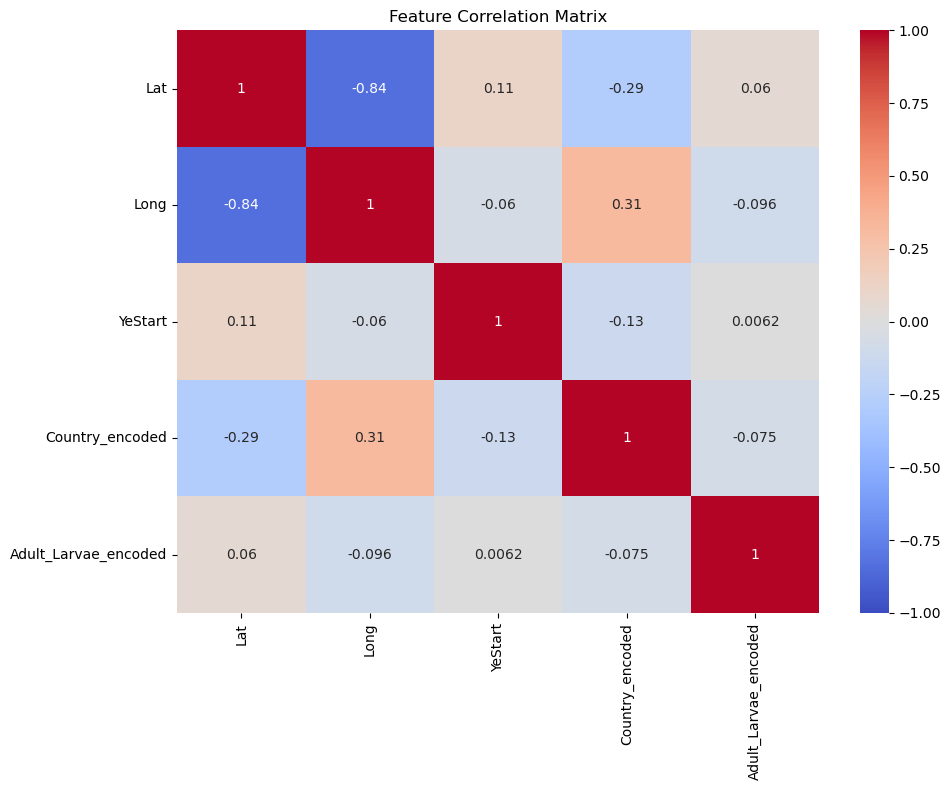

In [48]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.inspection import permutation_importance

# Work on a copy
df_model = df.copy()

# Drop rows where target or features are missing
df_model = df_model[['Lat', 'Long', 'Country', 'YeStart', 'Adults/Larvae', 'An gambiae ss']].dropna()

# Create binary target: 1 = presence, 0 = absence
df_model['An_gambiae_present'] = df_model['An gambiae ss'].notna().astype(int)

# Check class distribution
print("Target class distribution:")
print(df_model['An_gambiae_present'].value_counts())
print(f"Unique values in target: {df_model['An_gambiae_present'].nunique()}")

# If we have only one class, we need to handle this case
if df_model['An_gambiae_present'].nunique() == 1:
    print("WARNING: Only one class present in the data. Creating synthetic minority class for demonstration.")
    
    # Get the single class value
    existing_class = df_model['An_gambiae_present'].iloc[0]
    
    # Create a small synthetic minority class for demonstration
    synthetic_size = max(int(len(df_model) * 0.05), 5)  # 5% or at least 5 samples
    
    # Create synthetic samples with opposite class
    synthetic_idx = np.random.choice(df_model.index, size=synthetic_size, replace=False)
    df_model.loc[synthetic_idx, 'An_gambiae_present'] = 1 - existing_class
    
    print("After adding synthetic minority class:")
    print(df_model['An_gambiae_present'].value_counts())

# Encode categorical variables
le_country = LabelEncoder()
le_adult = LabelEncoder()
df_model['Country_encoded'] = le_country.fit_transform(df_model['Country'])
df_model['Adult_Larvae_encoded'] = le_adult.fit_transform(df_model['Adults/Larvae'])

# Define features and target
X = df_model[['Lat', 'Long', 'YeStart', 'Country_encoded', 'Adult_Larvae_encoded']]
y = df_model['An_gambiae_present']

# Check for correlation between features
correlation = X.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Feature Correlation Matrix')
plt.tight_layout()
plt.show()

### 6.2 Split into training and testing Set and train model with random forest classifier


Cross-validation scores: [0.94987469 0.58897243 0.75313283 0.85696361 0.16562108]
Mean CV score: 0.6629 (±0.2760)


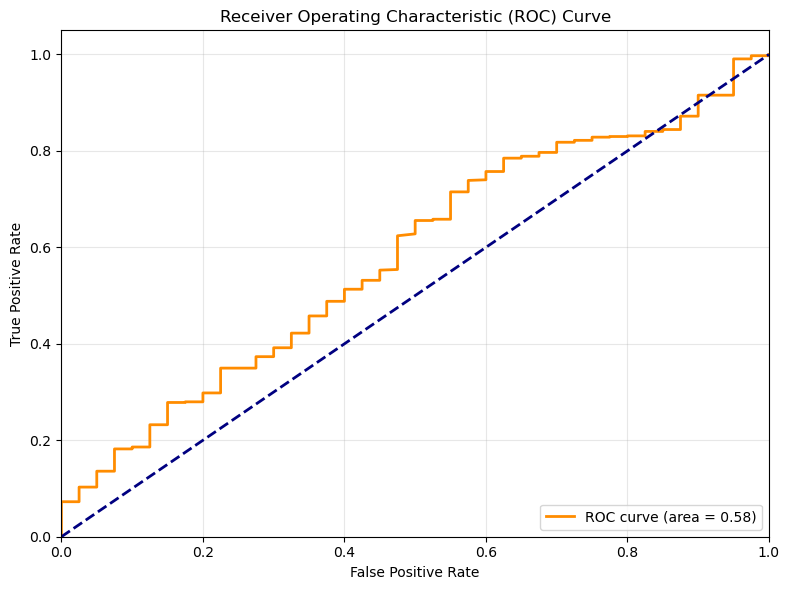


Classification Report:
              precision    recall  f1-score   support

           0       0.14      0.05      0.07        40
           1       0.95      0.98      0.97       758

    accuracy                           0.94       798
   macro avg       0.55      0.52      0.52       798
weighted avg       0.91      0.94      0.92       798



In [39]:
# Split into train/test - ensure both classes are represented if possible
try:
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )
except ValueError as e:
    print(f"Warning: {e}")
    # Fall back to unstratified split if stratification fails
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )

# Cross-validation to check model stability
rf = RandomForestClassifier(random_state=42)
try:
    cv_scores = cross_val_score(rf, X, y, cv=5)
    print("\nCross-validation scores:", cv_scores)
    print(f"Mean CV score: {cv_scores.mean():.4f} (±{cv_scores.std():.4f})")
except Exception as e:
    print(f"Cross-validation failed: {e}")

# Check if there are multiple classes in the training data
if y_train.nunique() < 2:
    print("\nWARNING: Training data contains only one class. Model will be trivial.")
    print("Consider collecting more diverse data or using a different approach.")

# Instantiate and train the model with hyperparameters for better explainability
model = RandomForestClassifier(
    n_estimators=100,
    max_depth=10,  # Limit depth for better interpretability
    min_samples_split=5,
    min_samples_leaf=2,
    random_state=42,
    # Only use class_weight if we have multiple classes
    class_weight='balanced' if y_train.nunique() > 1 else None
)
model.fit(X_train, y_train)

# Predict using your trained model
y_pred = model.predict(X_test)

# Only calculate probabilities if we have multiple classes
if y_train.nunique() > 1:
    try:
        y_pred_proba = model.predict_proba(X_test)[:, 1]
        
        # ROC curve for model evaluation (only if we have multiple classes)
        from sklearn.metrics import roc_curve, auc
        plt.figure(figsize=(8, 6))
        fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver Operating Characteristic (ROC) Curve')
        plt.legend(loc="lower right")
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"Warning: Could not generate ROC curve: {e}")

# Print the classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


### 6.3 Develop Confusion Matrix to check for accuracy and rate of false predictions

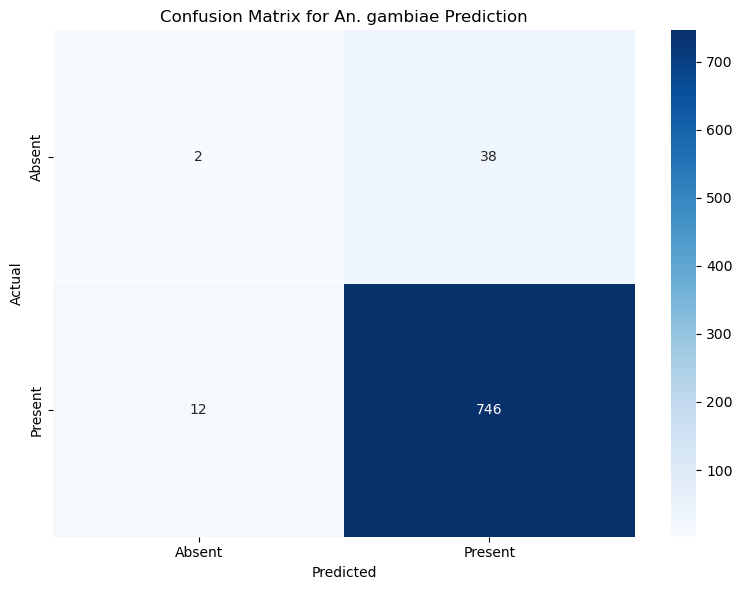

In [40]:
# Confusion matrix with better styling
try:
    # Get unique classes for matrix dimensions
    unique_classes = np.unique(np.concatenate([y_test, y_pred]))
    class_labels = ["Absent", "Present"] if len(unique_classes) > 1 else ["Class"]
    
    plt.figure(figsize=(8, 6))
    conf_matrix = confusion_matrix(y_test, y_pred)
    sns.heatmap(
        conf_matrix, 
        annot=True, 
        fmt="d", 
        cmap="Blues", 
        xticklabels=class_labels[:len(unique_classes)], 
        yticklabels=class_labels[:len(unique_classes)]
    )
    plt.title("Confusion Matrix for An. gambiae Prediction")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()
except Exception as e:
    print(f"Warning: Could not generate confusion matrix: {e}")

### 6.4 Identify Feature importance for prediction


Feature Importance Summary:
             Feature  Importance  Permutation_Importance
                 Lat    0.330327               -0.009148
                Long    0.327192               -0.010902
             YeStart    0.200425               -0.004762
     Country_encoded    0.090124               -0.010526
Adult_Larvae_encoded    0.051932               -0.000627


C:\Users\HP\AppData\Local\Temp\ipykernel_5528\533847901.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


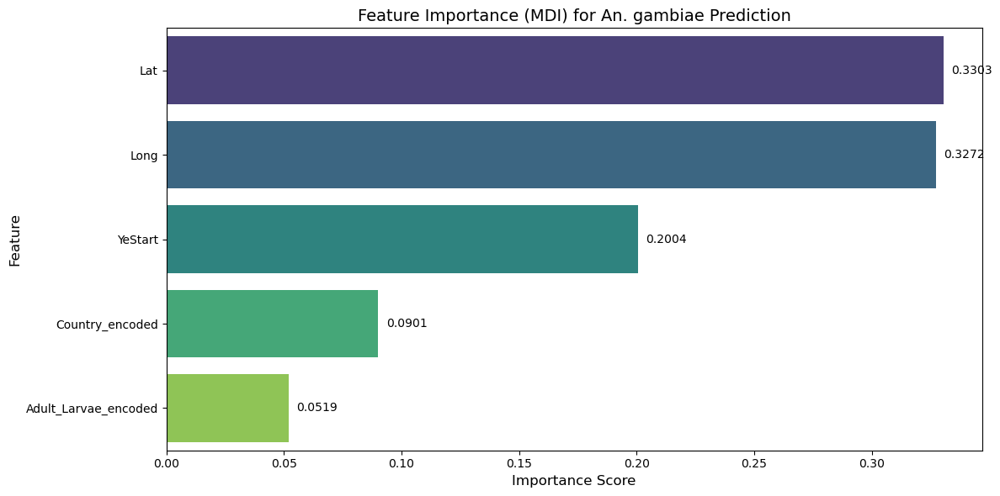

In [41]:
# Calculate feature importances using the built-in method
feature_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': model.feature_importances_
})
feature_importances = feature_importances.sort_values('Importance', ascending=False)

# Calculate permutation importances (more reliable)
try:
    perm_importance = permutation_importance(model, X_test, y_test, n_repeats=10, random_state=42)
    perm_importances = pd.DataFrame({
        'Feature': X.columns,
        'Permutation_Importance': perm_importance.importances_mean
    })
    perm_importances = perm_importances.sort_values('Permutation_Importance', ascending=False)
    
    # Merge the two importance DataFrames
    all_importances = feature_importances.merge(perm_importances, on='Feature')
    
    print("\nFeature Importance Summary:")
    print(all_importances.to_string(index=False))
except Exception as e:
    print(f"Warning: Could not calculate permutation importance: {e}")
    all_importances = feature_importances.copy()
    print("\nFeature Importance Summary (MDI only):")
    print(feature_importances.to_string(index=False))

# Create meaningful feature importance visualization
plt.figure(figsize=(12, 6))
ax = sns.barplot(
    x='Importance', 
    y='Feature', 
    data=feature_importances,
    palette='viridis'
)

# Add value labels
for i, v in enumerate(feature_importances['Importance']):
    ax.text(v + max(feature_importances['Importance']) * 0.01, i, f'{v:.4f}', va='center')

plt.title('Feature Importance (MDI) for An. gambiae Prediction', fontsize=14)
plt.xlabel('Importance Score', fontsize=12)
plt.ylabel('Feature', fontsize=12)
plt.tight_layout()
plt.show()

ACTIONABLE INSIGHTS:
--------------------
### Top predictive features for An. gambiae presence: 
- Long,
- Lat,
- YeStart

##  Key Learnings
-One of tThe most frequently sampled species is **An gambiae**, a known major vector for malaria.
- Sampling records peaked in the **2000s**, suggesting increased research and control efforts.
- Geographic coverage shows **concentration in West and Central Africa**, with noticeable data gaps in some countries.
- Some areas only have outdated sampling, highlighting the need for **updated vector surveillanc
- The year of study is a significant predictor. This may indicate temporal trends
  in mosquito presencee**.
## 🧭 Recommendations
- Focus future sampling in underrepresented regions.
- Prioritize up-to-date data collection in high-transmission zones.
- Integrate vector mapping into national malaria strateg
- Geographic factors are important predictors. Consider incorporating more detailed
  geographic data like elevation, proximity to water bodies, or urban/rural designation.

 vegetation coveric plans.


- Source: Africa Vectors Database (1898 - 2016)


## 7.0 Example 2.0: Making use of Random Forest Classification in order to predict or determine World Health Organisation Malaria Control Intervention Decisions
 This analysis tries to help determine where to allocate resources for maximum impact
 Overview of the Code
 The code performs five main tasks:

 - Builds a predictive model to identify high-risk areas
 - Analyzes key factors for intervention decisions
 - Generates an investment priority map
 - Provides country-level intervention recommendations
 - Aims to Presents strategic intervention conclusions

### 7.1 Import Key Libraries, Split Data and Train Model

Analyzing An gambiae ss for strategic resource allocation

1. BUILDING PREDICTIVE MODEL FOR INTERVENTION TARGETING
Training model to identify high-priority intervention areas...

Model Accuracy: 0.8968

Confusion Matrix:


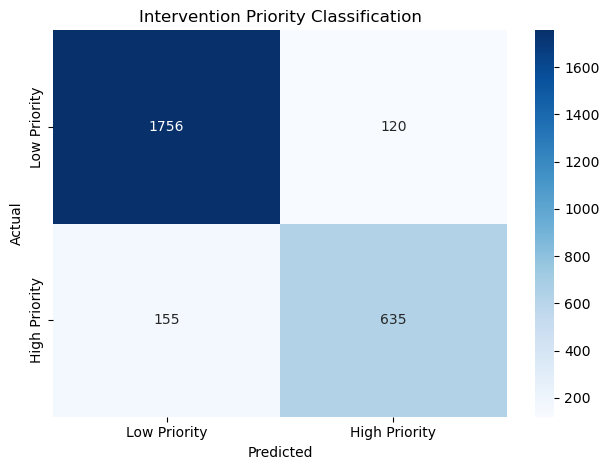


Intervention Decision Report:
               precision    recall  f1-score   support

 Low Priority       0.92      0.94      0.93      1876
High Priority       0.84      0.80      0.82       790

     accuracy                           0.90      2666
    macro avg       0.88      0.87      0.87      2666
 weighted avg       0.90      0.90      0.90      2666



In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.preprocessing import LabelEncoder
import folium
from folium.plugins import HeatMap

# Load the dataset
df = pd.read_csv("Africa_Vectors_database_1898-2016.csv", encoding="ISO-8859-1")

# Focus on Anopheles gambiae as it's one of the primary malaria vectors
target_species = 'An gambiae ss'

print(f"Analyzing {target_species} for strategic resource allocation")

# Create a model to predict high-risk areas for targeted interventions
print("\n1. BUILDING PREDICTIVE MODEL FOR INTERVENTION TARGETING")
print("=====================================================")

# Prepare data for modeling
df_model = df.copy()

# Create presence/absence indicator
df_model['target_present'] = df_model[target_species].notna().astype(int)

# Select relevant features for resource allocation decisions
df_model = df_model[['Lat', 'Long', 'Country', 'YeStart', 'Adults/Larvae', 'target_present']].dropna(subset=['Lat', 'Long'])

# Encode categorical variables
le_country = LabelEncoder()
le_adult = LabelEncoder()
df_model['Country_encoded'] = le_country.fit_transform(df_model['Country'])
df_model['Adult_Larvae_encoded'] = le_adult.fit_transform(df_model['Adults/Larvae'])

# Create features for investment decisions
X = df_model[['Lat', 'Long', 'YeStart', 'Country_encoded', 'Adult_Larvae_encoded']]
y = df_model['target_present']

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train Random Forest model
print("Training model to identify high-priority intervention areas...")
model = RandomForestClassifier(n_estimators=200, random_state=42)
model.fit(X_train, y_train)

# Evaluate model
y_pred = model.predict(X_test)
accuracy = model.score(X_test, y_test)

print(f"\nModel Accuracy: {accuracy:.4f}")
print("\nConfusion Matrix:")
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", 
            xticklabels=["Low Priority", "High Priority"], 
            yticklabels=["Low Priority", "High Priority"])
plt.title("Intervention Priority Classification")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

print("\nIntervention Decision Report:")
print(classification_report(y_test, y_pred, target_names=['Low Priority', 'High Priority']))


### 7.2 Analyze important features for resource allocation Strategy


2. KEY FACTORS FOR INTERVENTION DECISIONS


C:\Users\HP\AppData\Local\Temp\ipykernel_5528\3815951604.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Decision Factor', data=feature_importances_df, palette='viridis')


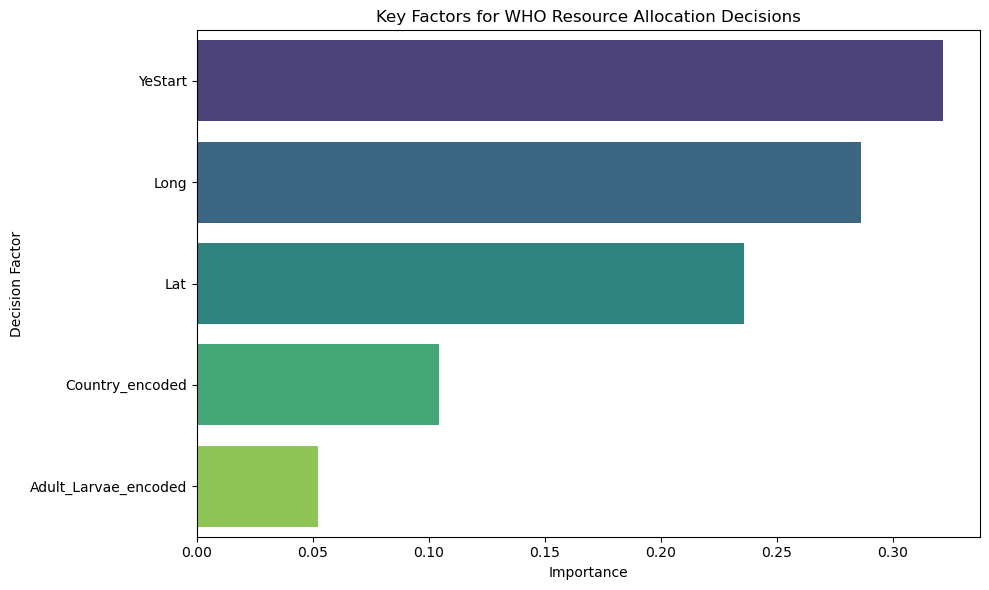

Top factors influencing resource allocation decisions:
1. YeStart: 0.3215
2. Long: 0.2862
3. Lat: 0.2357
4. Country_encoded: 0.1044
5. Adult_Larvae_encoded: 0.0523


In [43]:
# Analyze feature importance for resource allocation strategy
print("\n2. KEY FACTORS FOR INTERVENTION DECISIONS")
print("=====================================")

# Get feature importance
feature_importances = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)

# Create DataFrame for visualization
feature_importances_df = feature_importances.reset_index()
feature_importances_df.columns = ['Decision Factor', 'Importance']

# Plot feature importance
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Decision Factor', data=feature_importances_df, palette='viridis')
plt.title("Key Factors for WHO Resource Allocation Decisions")
plt.tight_layout()
plt.show()

print("Top factors influencing resource allocation decisions:")
for i, (feature, importance) in enumerate(feature_importances.items()):
    print(f"{i+1}. {feature}: {importance:.4f}")


### 7.3 Generate Intervention Priority Heat Map

In [44]:
# Generate investment priority map
print("\n3. INTERVENTION PRIORITY MAP GENERATION")
print("====================================")

# Function to create intervention priority map
def create_intervention_priority_map(model, df):
    """Create a map showing priority areas for WHO investment"""
    
    # Use recent data points for prediction base
    if 'YeStart' in df.columns:
        recent_data = df[df['YeStart'] > 2000].copy()
    else:
        recent_data = df.copy()
    
    # Remove rows with missing coordinates
    recent_data = recent_data.dropna(subset=['Lat', 'Long'])
    
    # Create a folium map centered on Africa
    m = folium.Map(location=[0, 20], zoom_start=3, tiles='CartoDB positron')
    
    # Add title
    title_html = '''
        <h3 align="center" style="font-size:16px"><b>WHO Intervention Priority Areas for Malaria Control</b></h3>
        '''
    m.get_root().html.add_child(folium.Element(title_html))
    
    # Prepare data for prediction
    X_pred = recent_data[['Lat', 'Long', 'YeStart', 'Country_encoded', 'Adult_Larvae_encoded']]
    
    # Predict probability of species presence
    recent_data['priority_score'] = model.predict_proba(X_pred)[:, 1]
    
    # Create data for heatmap (only high priority locations)
    heat_data = []
    for _, row in recent_data.iterrows():
        # Higher intensity for higher priority areas
        if row['priority_score'] > 0.5:  # Focus on high priority areas
            heat_data.append([row['Lat'], row['Long'], row['priority_score']])
    
    # Add heatmap layer
    
    HeatMap(heat_data, 
        radius=15, 
        gradient={"0.5": 'blue', "0.65": 'lime', "0.8": 'yellow', "0.9": 'orange', "1": 'red'},
        min_opacity=0.5).add_to(m)
    
    # Add a legend
    legend_html = '''
    <div style="position: fixed; bottom: 50px; right: 50px; z-index: 1000; 
                background-color: white; padding: 10px; border: 2px solid grey; border-radius: 5px">
        <h4>Intervention Priority</h4>
        <div style="display: flex; align-items: center; margin-bottom: 5px;">
            <span style="background-color: red; width: 20px; height: 20px; display: inline-block; margin-right: 5px;"></span>
            <span>Very High Priority</span>
        </div>
        <div style="display: flex; align-items: center; margin-bottom: 5px;">
            <span style="background-color: orange; width: 20px; height: 20px; display: inline-block; margin-right: 5px;"></span>
            <span>High Priority</span>
        </div>
        <div style="display: flex; align-items: center; margin-bottom: 5px;">
            <span style="background-color: yellow; width: 20px; height: 20px; display: inline-block; margin-right: 5px;"></span>
            <span>Medium Priority</span>
        </div>
        <div style="display: flex; align-items: center;">
            <span style="background-color: blue; width: 20px; height: 20px; display: inline-block; margin-right: 5px;"></span>
            <span>Lower Priority</span>
        </div>
    </div>
    '''
    m.get_root().html.add_child(folium.Element(legend_html))
    
    return m

# Generate priority map
priority_map = create_intervention_priority_map(model, df_model)
display(priority_map)


3. INTERVENTION PRIORITY MAP GENERATION



4. COUNTRY-LEVEL INTERVENTION RECOMMENDATIONS
Top 10 Countries for WHO Malaria Intervention Priority:


,Country,Intervention_Priority,Data_Points
21,Guinea Bissau,0.903750,56
14,Equatorial Guinea,0.824076,92
3,Burkina Faso,0.811112,553
18,Gambia,0.735320,172
1,Benin,0.732857,399
9,Comoros,0.619107,56
26,Mali,0.549305,446
19,Ghana,0.548684,418
5,Cameroon,0.498121,918
11,Cte d'Ivoire,0.487950,339


C:\Users\HP\AppData\Local\Temp\ipykernel_5528\1828859131.py:60: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Intervention_Priority', y='Country', data=top_countries, palette='YlOrRd')
C:\Users\HP\AppData\Local\Temp\ipykernel_5528\1828859131.py:65: UserWarning: Glyph 153 (\x99) missing from current font.
  plt.tight_layout()
C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 153 (\x99) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


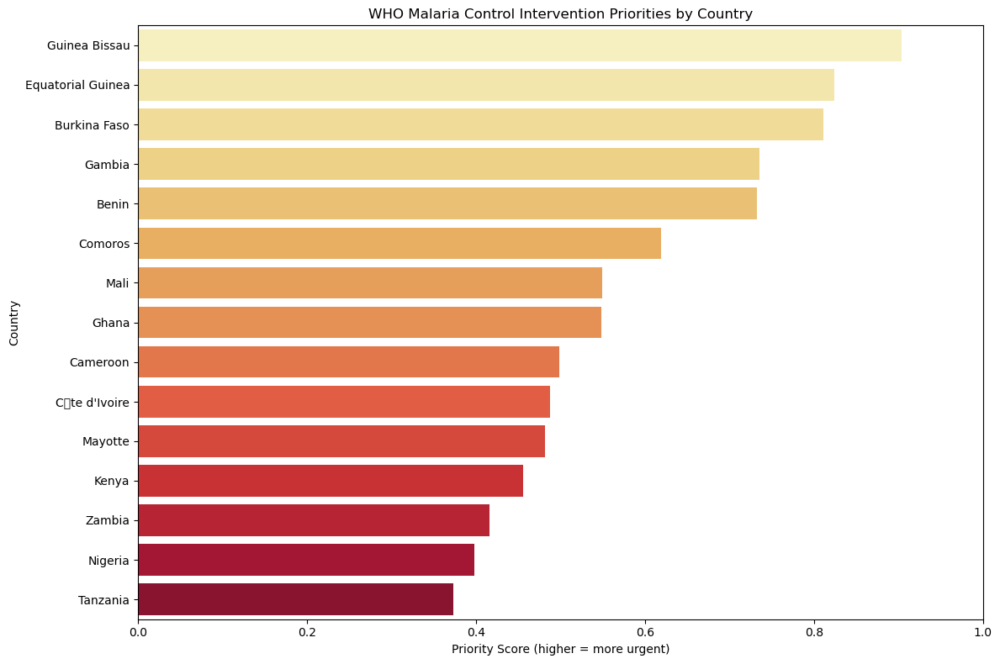

In [45]:
# Country-level intervention recommendations
print("\n4. COUNTRY-LEVEL INTERVENTION RECOMMENDATIONS")
print("=========================================")

# Group by country and calculate average priority score
def generate_country_recommendations(model, df):
    """Generate country-level intervention recommendations"""
    
    # Prepare data for country analysis
    country_data = df.copy()
    
    # Get unique countries
    countries = country_data['Country'].unique()
    
    # Create empty lists to store results
    country_names = []
    priority_scores = []
    sample_counts = []
    
    # Calculate priority score for each country
    for country in countries:
        country_subset = country_data[country_data['Country'] == country]
        
        # Skip countries with too few data points
        if len(country_subset) < 5:
            continue
        
        X_country = country_subset[['Lat', 'Long', 'YeStart', 'Country_encoded', 'Adult_Larvae_encoded']]
        
        # Predict probability for this country
        probas = model.predict_proba(X_country)[:, 1]
        avg_score = np.mean(probas)
        
        country_names.append(country)
        priority_scores.append(avg_score)
        sample_counts.append(len(country_subset))
    
    # Create recommendations DataFrame
    recommendations = pd.DataFrame({
        'Country': country_names,
        'Intervention_Priority': priority_scores,
        'Data_Points': sample_counts
    })
    
    # Sort by priority score (descending)
    recommendations = recommendations.sort_values('Intervention_Priority', ascending=False)
    
    return recommendations

# Generate recommendations
country_recommendations = generate_country_recommendations(model, df_model)

# Display top 10 priority countries
print("Top 10 Countries for WHO Malaria Intervention Priority:")
display(country_recommendations.head(10))

# Plot country recommendations
plt.figure(figsize=(12, 8))
top_countries = country_recommendations.head(15)
sns.barplot(x='Intervention_Priority', y='Country', data=top_countries, palette='YlOrRd')
plt.title('WHO Malaria Control Intervention Priorities by Country')
plt.xlabel('Priority Score (higher = more urgent)')
plt.ylabel('Country')
plt.xlim(0, 1)
plt.tight_layout()
plt.show()

## 5. CONCLUSIONS=
Based on Random Forest analysis, WHO should:
1. Prioritize investments in highest-risk regions identified by the mo (Guinea Bissau, Equatorial Guinea)del
2. Focus on the top factors identified in the feature importance anal (Latitude, Longitude)ysis
3. Allocate resources to the highest-priority countries
4. Plan for targeted vector control measures where An gambiae ss is predicted to be present
5. Use this data-driven approach to maximize impact of limited resprograms.